In [68]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display
import IPython.display as ipd
import scipy as sp

In [15]:
acoustic_guitar_path = "acoustic_guitar.wav"
ipd.Audio(acoustic_guitar_path)

In [10]:
brass_path = "brass.wav"
ipd.Audio(brass_path)

In [14]:
# Keep volume low!
drum_set_path = "drum_set.wav"
ipd.Audio(drum_set_path)

In [23]:
# Load music in librosa
sr = 22050
acoustic_guitar, sr = librosa.load(acoustic_guitar_path, sr = sr)
brass, sr = librosa.load(brass_path, sr = sr)
drum_set, sr = librosa.load(drum_set_path, sr = sr)

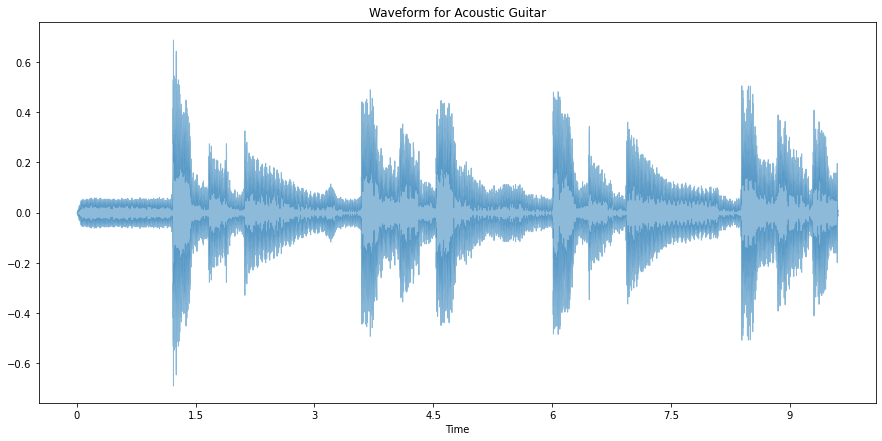

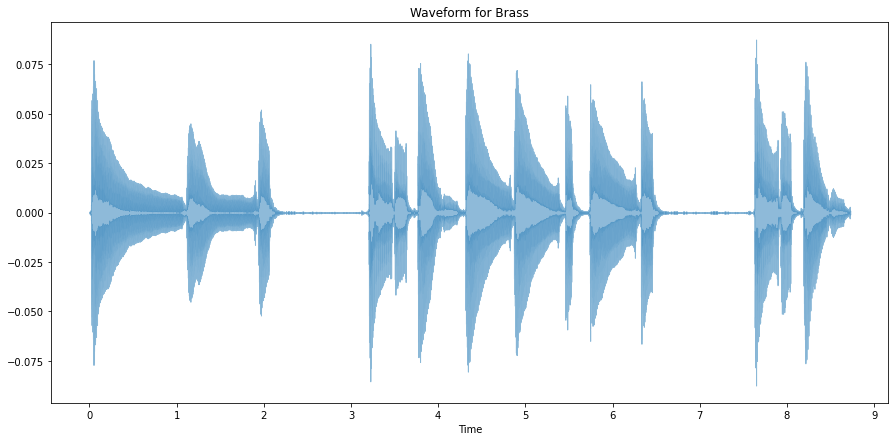

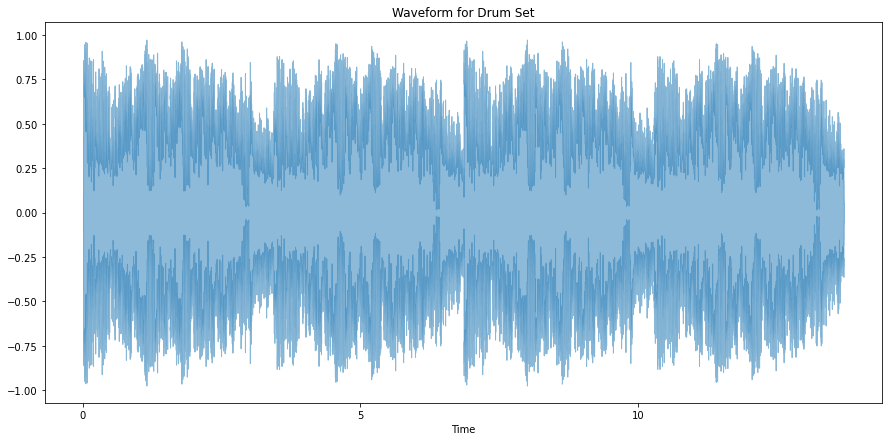

In [63]:
def show_waveform(signal, name=""):
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Display the waveform of the signal using librosa
    librosa.display.waveshow(signal, alpha=0.5)
    # Set the title of the plot
    plt.title("Waveform for " + name)
    # Show the plot
    plt.show()

show_waveform(acoustic_guitar, "Acoustic Guitar")
show_waveform(brass, "Brass")
show_waveform(drum_set, "Drum Set")

# Time Domain Features

### Amplitude Envelope

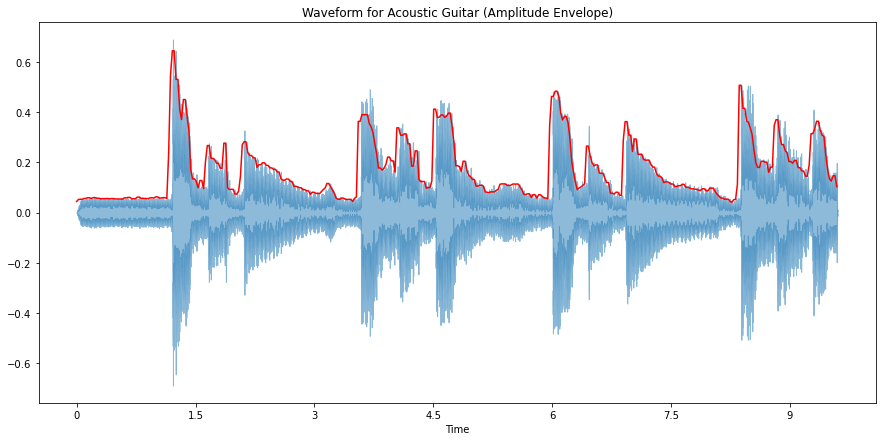

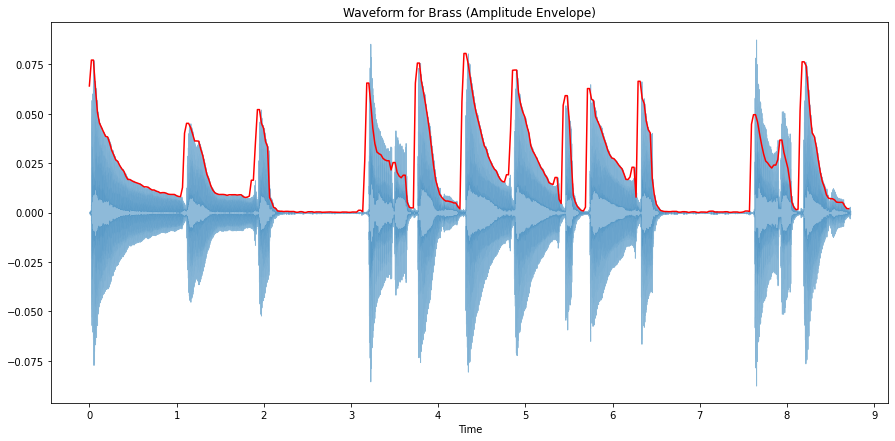

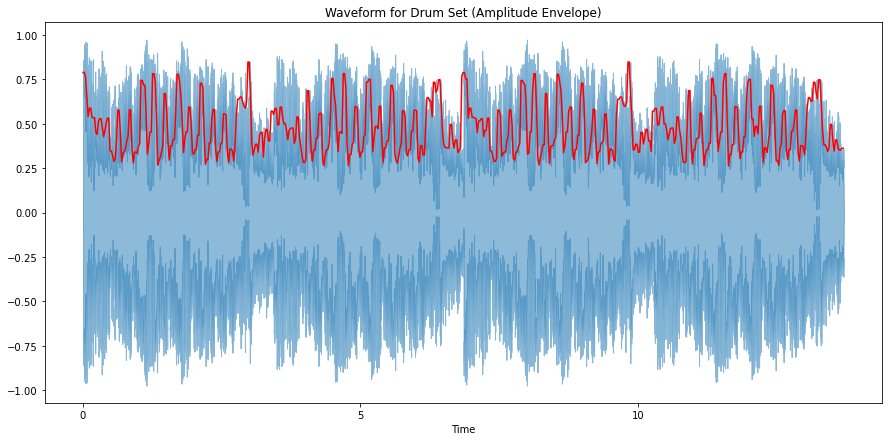

In [64]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

def amplitude_envelope(signal, frame_size=1024, hop_length=512):
    """
    Computes the Amplitude Envelope of a signal using a sliding window.

    Args:
        signal (array): The input signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.

    Returns:
        np.array: An array of Amplitude Envelope values.
    """
    res = []
    for i in range(0, len(signal), hop_length):
        # Get a portion of the signal
        cur_portion = signal[i:i + frame_size]  
        # Compute the maximum value in the portion
        ae_val = max(cur_portion)  
        # Store the amplitude envelope value
        res.append(ae_val)  
    # Convert the result to a NumPy array
    return np.array(res)

def plot_amplitude_envelope(signal, name, frame_size=1024, hop_length=512):
     """
    Plots the waveform of a signal with the overlay of Amplitude Envelope values.

    Args:
        signal (array): The input signal.
        name (str): The name of the signal for the plot title.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
    """
    # Compute the amplitude envelope
    ae = amplitude_envelope(signal, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(ae))  
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)  
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))  
    # Display the waveform of the signal
    librosa.display.waveshow(signal, alpha=0.5)  
    # Plot the amplitude envelope over time
    plt.plot(time, ae, color="r") 
    # Set the title of the plot
    plt.title("Waveform for " + name + " (Amplitude Envelope)")  
    # Show the plot
    plt.show()  
    
plot_amplitude_envelope(acoustic_guitar, "Acoustic Guitar")
plot_amplitude_envelope(brass, "Brass")
plot_amplitude_envelope(drum_set, "Drum Set")

### Root Mean Square Energy

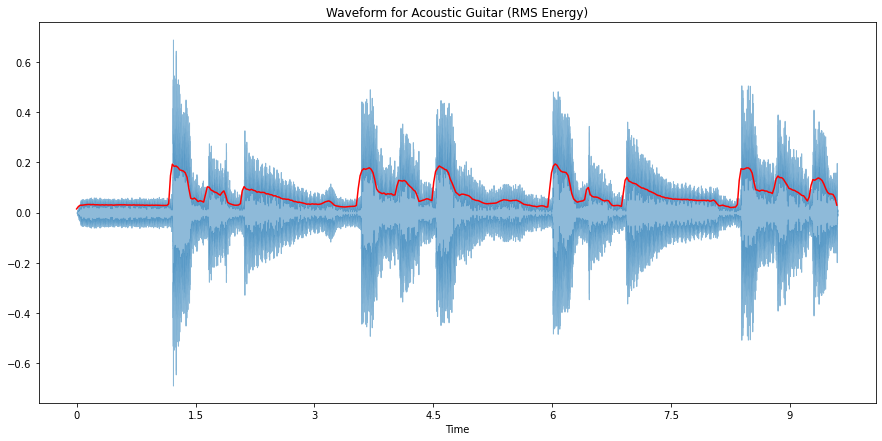

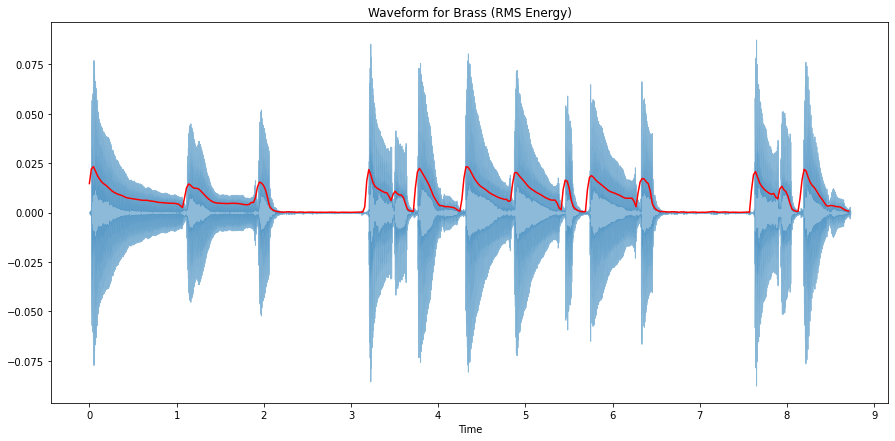

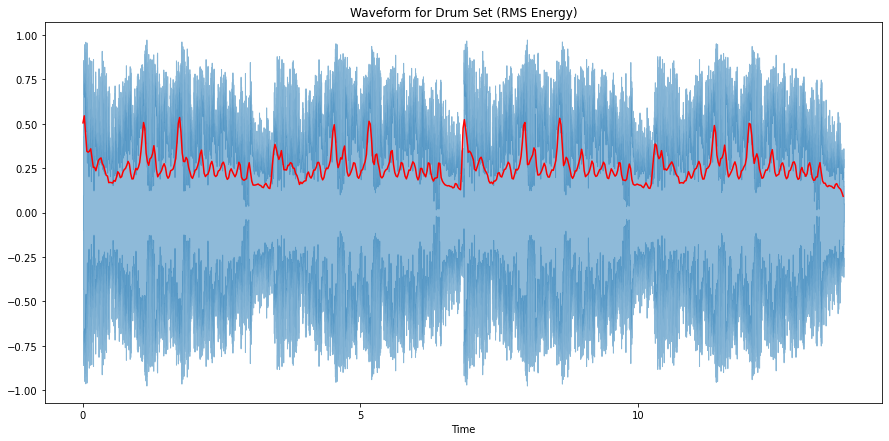

In [65]:
def RMS_energy(signal, frame_size=1024, hop_length=512):
    """
    Computes the RMS (Root Mean Square) energy of a signal using a sliding window.

    Args:
        signal (array): The input signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.

    Returns:
        np.array: An array of RMS energy values.
    """
    res = []
    for i in range(0, len(signal), hop_length):
        # Extract a portion of the signal
        cur_portion = signal[i:i + frame_size]  
        # Compute the RMS energy for the portion
        rmse_val = np.sqrt(1 / len(cur_portion) * sum(i**2 for i in cur_portion))  
        res.append(rmse_val)
    # Convert the result to a NumPy array
    return np.array(res)

def plot_RMS_energy(signal, name, frame_size=1024, hop_length=512):
    """
    Plots the waveform of a signal with the overlay of RMS energy values.

    Args:
        signal (array): The input signal.
        name (str): The name of the signal for the plot title.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
    """
    # Compute the RMS Energy
    rmse = RMS_energy(signal, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(rmse))  
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length) 
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Display the waveform as a spectrogram-like plot
    librosa.display.waveshow(signal, alpha=0.5)  
    # Plot the RMS energy values
    plt.plot(time, rmse, color="r") 
    # Set the title of the plot
    plt.title("Waveform for " + name + " (RMS Energy)")
    plt.show()

plot_RMS_energy(acoustic_guitar, "Acoustic Guitar")
plot_RMS_energy(brass, "Brass")
plot_RMS_energy(drum_set, "Drum Set")

### Crest Factor

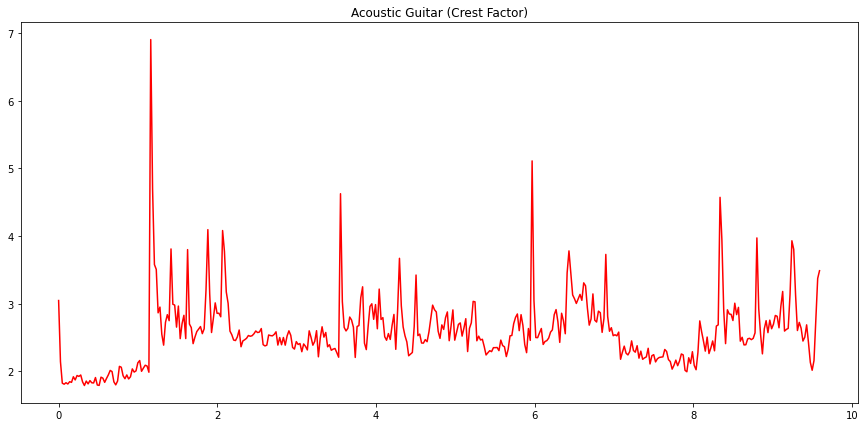

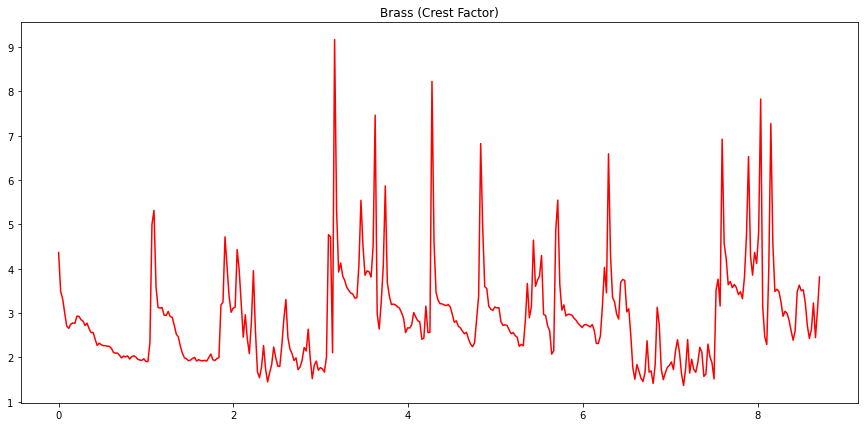

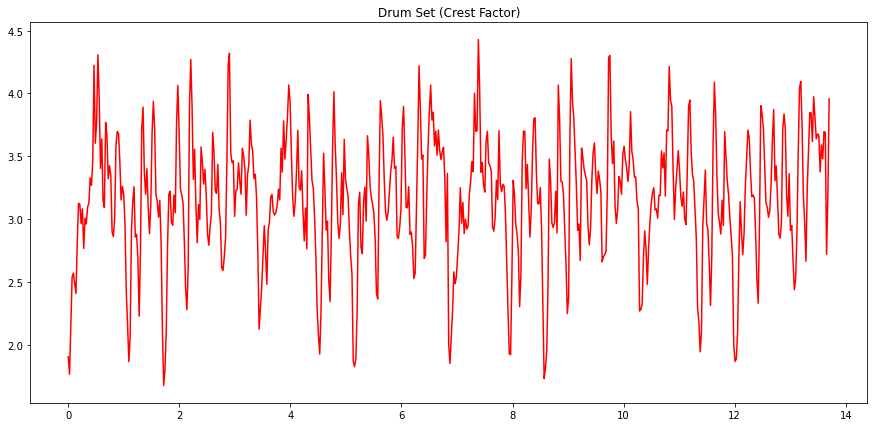

In [112]:
def crest_factor(signal, frame_size=1024, hop_length=512):
    """
    Computes the crest factor of a signal using a sliding window.

    Args:
        signal (array): The input signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.

    Returns:
        np.array: An array of crest factor values.
    """
    res = []
    for i in range(0, len(signal), hop_length):
        # Get a portion of the signal
        cur_portion = signal[i:i + frame_size]  
        # Compute the RMS energy for the portion
        rmse_val = np.sqrt(1 / len(cur_portion) * sum(i ** 2 for i in cur_portion))  
        # Compute the crest factor
        crest_val = max(np.abs(cur_portion)) / rmse_val  
        # Store the crest factor value
        res.append(crest_val)  
    # Convert the result to a NumPy array
    return np.array(res)  

def plot_crest_factor(signal, name, frame_size=1024, hop_length=512):
    """
    Plots the crest factor of a signal over time.

    Args:
        signal (array): The input signal.
        name (str): The name of the signal for the plot title.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
    """
    # Compute the crest factor
    crest = crest_factor(signal, frame_size, hop_length)  
    # Generate the frame indices
    frames = range(0, len(crest))  
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)  
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))  
    # Plot the crest factor over time
    plt.plot(time, crest, color="r")  
    # Set the title of the plot
    plt.title(name + " (Crest Factor)")  
    # Show the plot
    plt.show()  
    
plot_crest_factor(acoustic_guitar, "Acoustic Guitar")
plot_crest_factor(brass, "Brass")
plot_crest_factor(drum_set, "Drum Set")

### Zero Crossing Rate

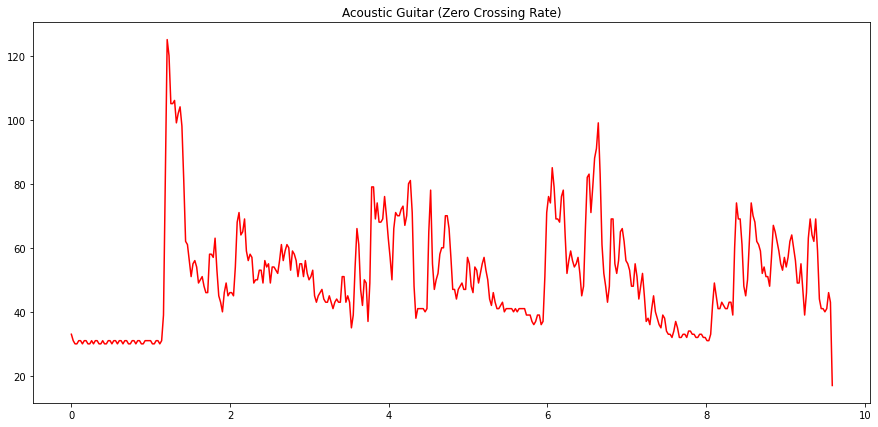

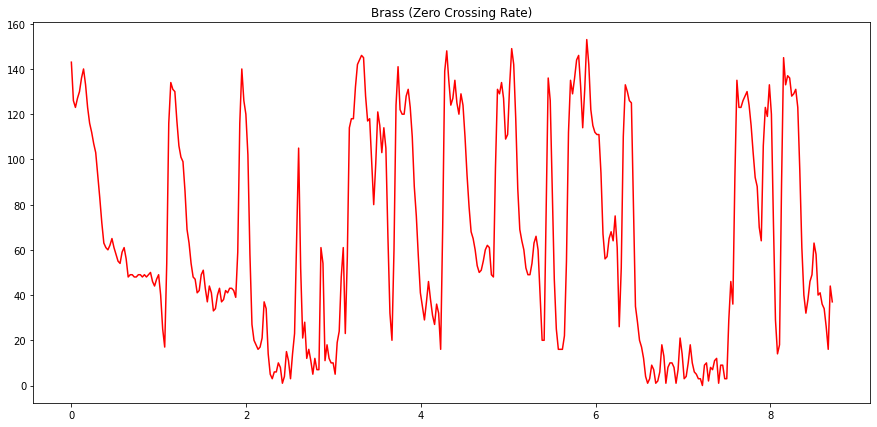

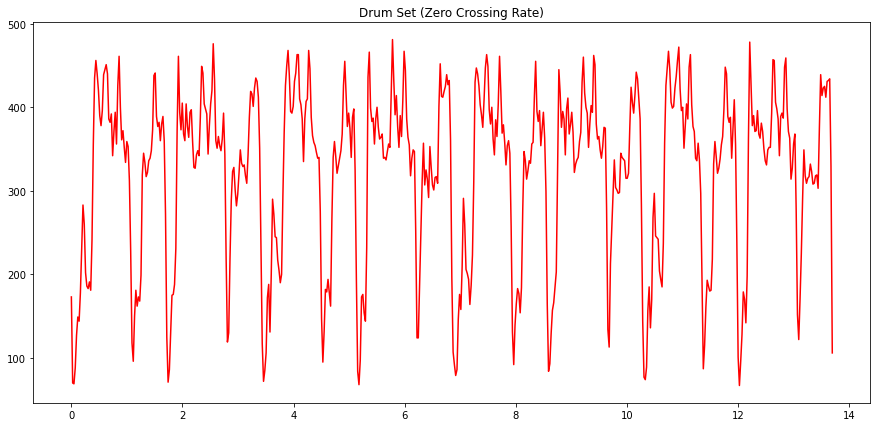

In [83]:
def ZCR(signal, frame_size=1024, hop_length=512):
    """
    Computes the Zero Crossing Rate (ZCR) of a signal using a sliding window.

    Args:
        signal (array): The input signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.

    Returns:
        np.array: An array of ZCR values.
    """
    res = []
    for i in range(0, len(signal), hop_length):
        # Get a portion of the signal
        cur_portion = signal[i:i + frame_size]  
         # Compute the number of sign changes in the portion
        zcr_val = num_sign_changes(cur_portion) 
        # Store the ZCR value
        res.append(zcr_val)  
    # Convert the result to a NumPy array
    return np.array(res)  

def num_sign_changes(signal):
    """
    Computes the number of sign changes in a signal.

    Args:
        signal (array): The input signal.

    Returns:
        int: The number of sign changes.
    """
    res = 0
    for i in range(0, len(signal) - 1):
        # Check if there is a sign change between consecutive samples
        if (signal[i] * signal[i + 1] < 0):  
            res += 1
    return res

def plot_ZCR(signal, name, frame_size=1024, hop_length=512):
    """
    Plots the Zero Crossing Rate (ZCR) of a signal over time.

    Args:
        signal (array): The input signal.
        name (str): The name of the signal for the plot title.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
    """
    # Compute the ZCR
    zcr = ZCR(signal, frame_size, hop_length)  
    # Generate the frame indices
    frames = range(0, len(zcr)) 
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)  
     # Create a new figure with a specific size
    plt.figure(figsize=(15, 7)) 
    # Plot the ZCR over time
    plt.plot(time, zcr, color="r")  
    # Set the title of the plot
    plt.title(name + " (Zero Crossing Rate)")  
    # Show the plot
    plt.show()  
    
plot_ZCR(acoustic_guitar, "Acoustic Guitar")
plot_ZCR(brass, "Brass")
plot_ZCR(drum_set, "Drum Set")

# Frequency Domain Features

### Spectrogram

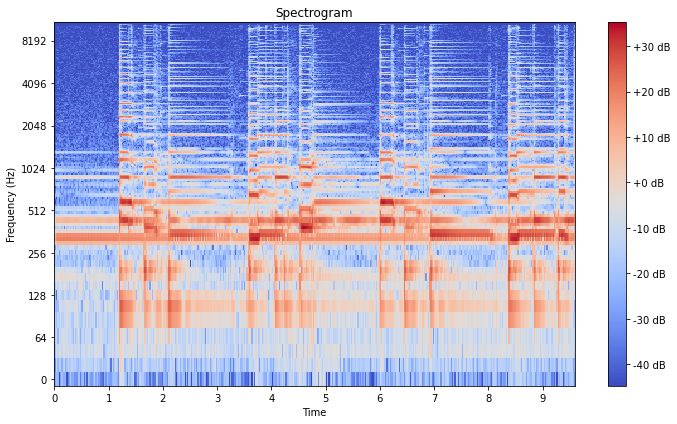

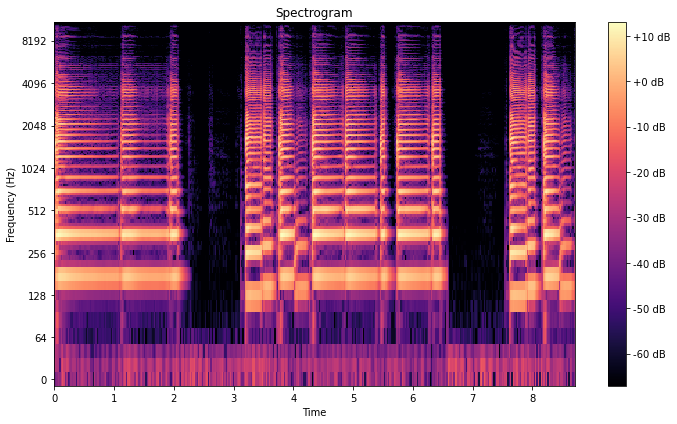

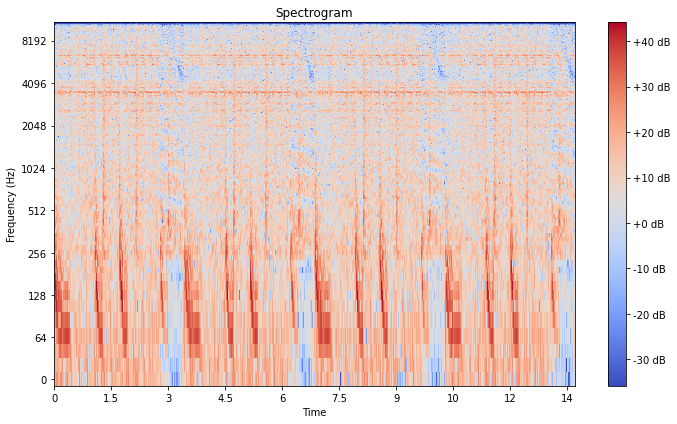

In [80]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

def plot_spectrogram(signal, sample_rate, frame_size=1024, hop_length=512):
    """
    Plots the spectrogram of an audio signal.

    Args:
        signal (array-like): The input audio signal.
        sample_rate (int): The sample rate of the audio signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
    """
    # Compute the STFT
    spectrogram = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)  
    # Convert the STFT to dB scale
    spectrogram_db = librosa.amplitude_to_db(np.abs(spectrogram))  
    # Create a new figure with a specific size
    plt.figure(figsize=(10, 6))  
    # Display the spectrogram
    librosa.display.specshow(spectrogram_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='log') 
    # Add a colorbar to show the magnitude scale
    plt.colorbar(format='%+2.0f dB') 
    # Set the title of the plot
    plt.title('Spectrogram')  
    # Set the label for the x-axis
    plt.xlabel('Time') 
    # Set the label for the y-axis
    plt.ylabel('Frequency (Hz)')  
    # Adjust the layout of the plot
    plt.tight_layout()  
    # Show the plot
    plt.show()  
    
plot_spectrogram(acoustic_guitar, sr)
plot_spectrogram(brass, sr)
plot_spectrogram(drum_set, sr)

### Mel Spectrogram

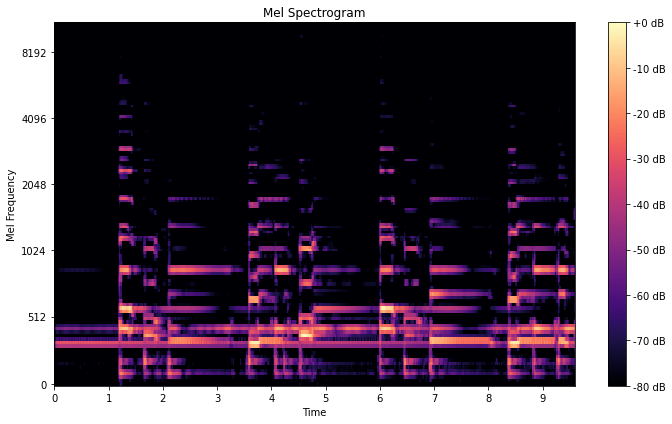

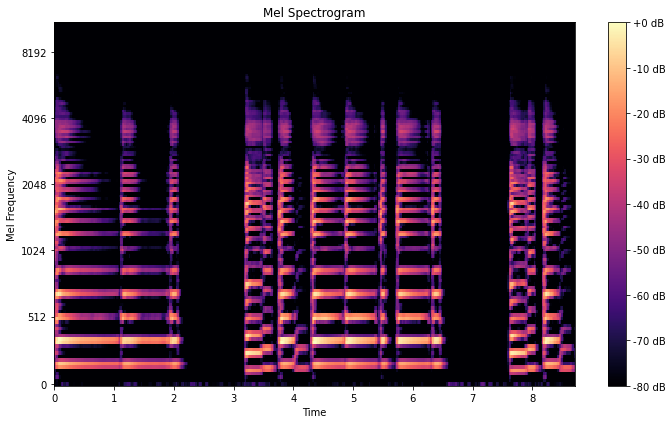

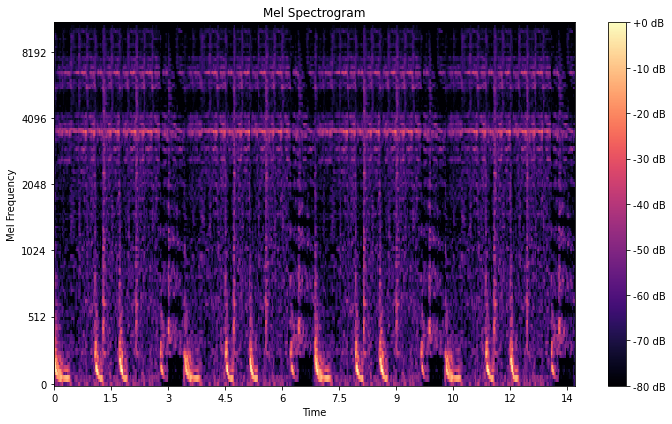

In [81]:
def plot_mel_spectrogram(signal, sample_rate, frame_size=2048, hop_length=512, n_mels=128):
    """
    Plots the Mel spectrogram of an audio signal.

    Args:
        signal (array-like): The input audio signal.
        sample_rate (int): The sample rate of the audio signal.
        frame_size (int): The size of each frame in samples.
        hop_length (int): The number of samples between consecutive frames.
        n_mels (int): The number of Mel frequency bins.
    """
    # Compute the Mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y = signal, sr=sample_rate, n_fft=frame_size, 
                                                     hop_length=hop_length, n_mels=n_mels)  
    # Convert the Mel spectrogram to dB scale
    mel_spectrogram_db = librosa.amplitude_to_db(mel_spectrogram, ref=np.max) 
    # Create a new figure with a specific size
    plt.figure(figsize=(10, 6))  
    # Display the Mel spectrogram
    librosa.display.specshow(mel_spectrogram_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='mel')  
    # Add a colorbar to show the magnitude scale
    plt.colorbar(format='%+2.0f dB')  
    # Set the title of the plot
    plt.title('Mel Spectrogram')  
    # Set the label for the x-axis
    plt.xlabel('Time') 
    # Set the label for the y-axis
    plt.ylabel('Frequency (Hz)')  
    # Adjust the layout of the plot
    plt.tight_layout()  
    # Show the plot
    plt.show()  
    
plot_mel_spectrogram(acoustic_guitar, sr)
plot_mel_spectrogram(brass, sr)
plot_mel_spectrogram(drum_set, sr)

### Band Energy Ratio

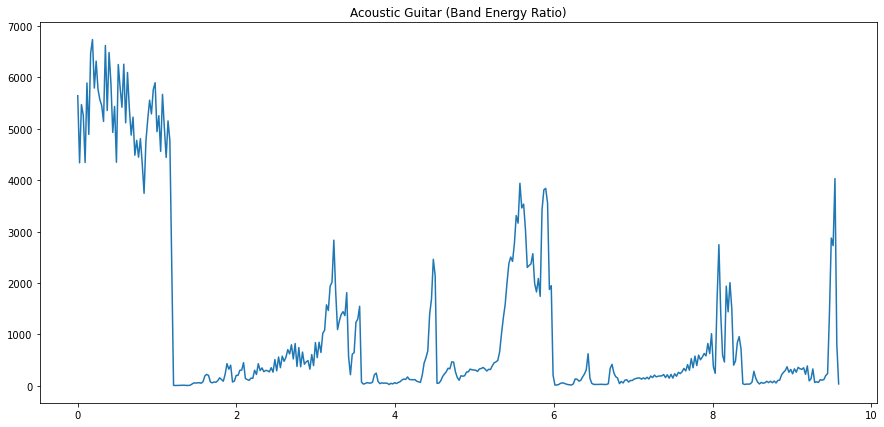

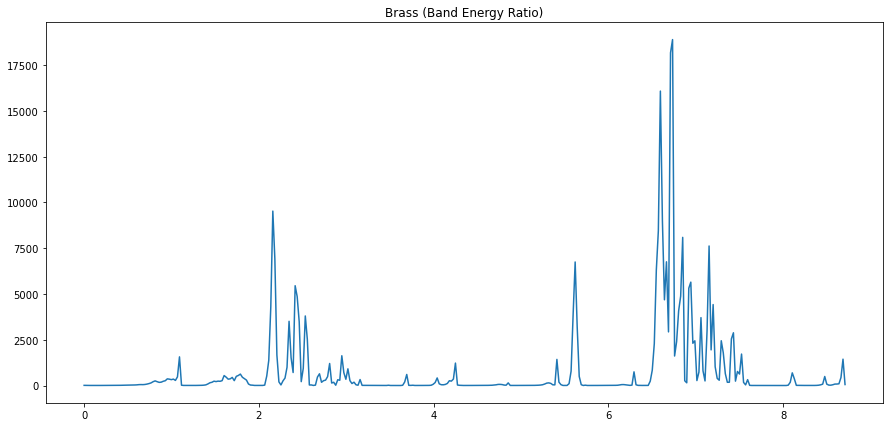

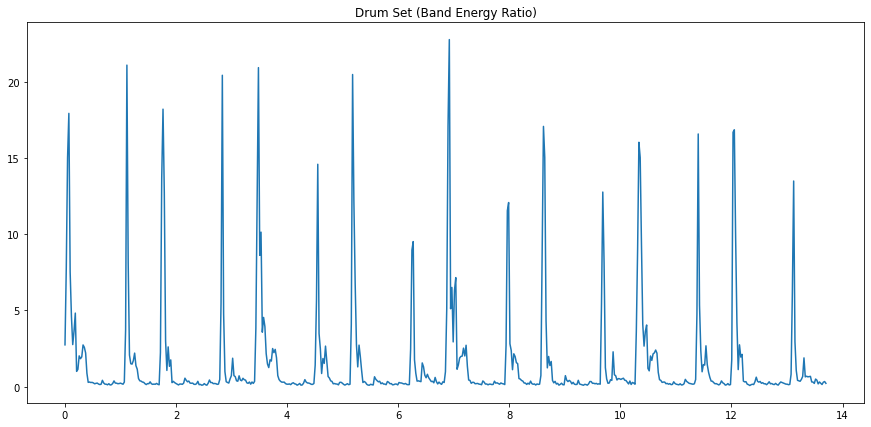

In [138]:
def find_split_freq_bin(spec, split_freq, sample_rate, frame_size=1024, hop_length=512):
    """
    Calculate the bin index corresponding to a given split frequency.

    Args:
        spec (array): The spectrogram.
        split_freq (float): The split frequency in Hz.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        int: The bin index corresponding to the split frequency.
    """
    # Calculate the range of frequencies
    range_of_freq = sample_rate / 2
    # Calculate the change in frequency per bin
    change_per_bin = range_of_freq / spec.shape[0]
    # Calculate the bin corresponding to the split frequency
    split_freq_bin = split_freq / change_per_bin
    return int(np.floor(split_freq_bin))

def band_energy_ratio(signal, split_freq, sample_rate, frame_size=1024, hop_length=512):
    """
    Compute the band energy ratio (BER) of a signal.

    Args:
        signal (array): The input signal.
        split_freq (float): The split frequency in Hz.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        ndarray: The band energy ratios for each frame of the signal.
    """
    # Compute the spectrogram of the signal
    spec = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)
    # Find the bin corresponding to the split frequency
    split_freq_bin = find_split_freq_bin(spec, split_freq, sample_rate, frame_size, hop_length)
    # Extract the magnitude and transpose it
    modified_spec = np.abs(spec).T
    res = []
    for sub_arr in modified_spec:
        # Compute the energy in the low-frequency range
        low_freq_density = sum(i ** 2 for i in sub_arr[:split_freq_bin])
        # Compute the energy in the high-frequency range
        high_freq_density = sum(i ** 2 for i in sub_arr[split_freq_bin:])
        # Compute the band energy ratio
        ber_val = low_freq_density / high_freq_density
        res.append(ber_val)
    return np.array(res)

def plot_band_energy_ratio(signal, split_freq, sample_rate, name, frame_size=1024, hop_length=512):
    """
    Plot the band energy ratio (BER) of a signal over time.

    Args:
        signal (ndarray): The input signal.
        split_freq (float): The split frequency in Hz.
        sample_rate (int): The sample rate of the audio.
        name (str): The name of the signal for the plot title.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.
    """
    # Compute the band energy ratio (BER)
    ber = band_energy_ratio(signal, split_freq, sample_rate, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(ber))
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Plot the BER over time
    plt.plot(time, ber)
    # Set the title of the plot
    plt.title(name + " (Band Energy Ratio)")
    # Show the plot
    plt.show()
    
plot_band_energy_ratio(acoustic_guitar, 2048, sr, "Acoustic Guitar")
plot_band_energy_ratio(brass, 2048, sr, "Brass")
plot_band_energy_ratio(drum_set, 2048, sr, "Drum Set")

### Spectral Centroid

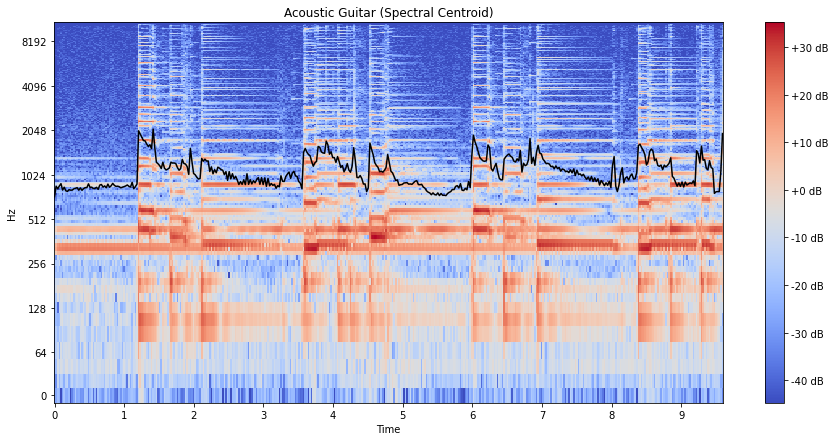

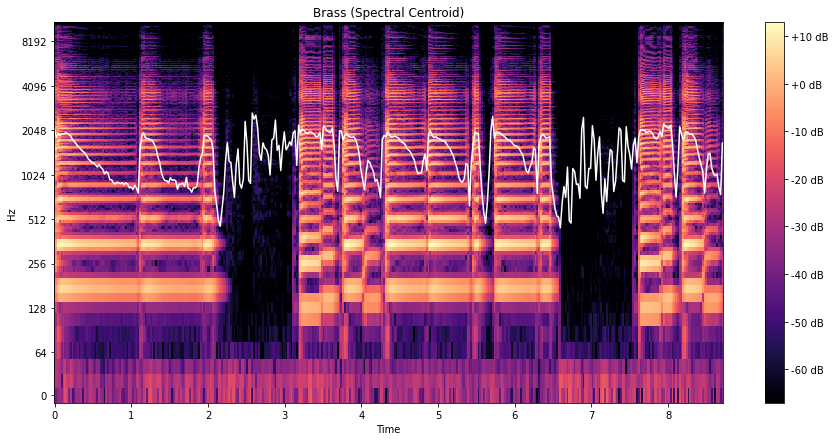

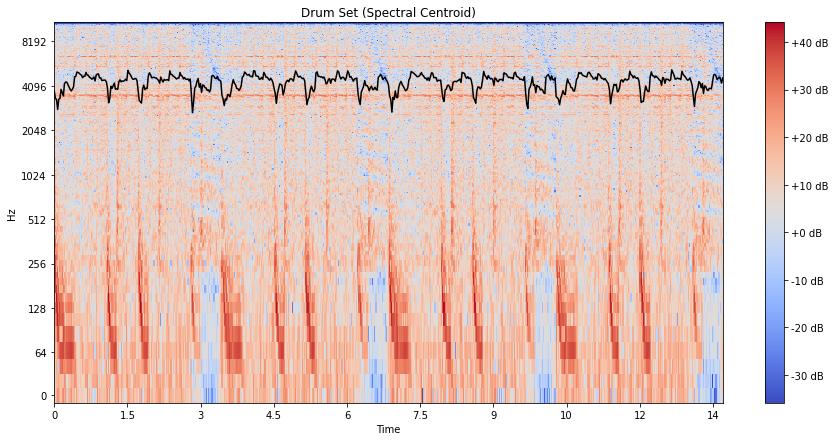

In [133]:
def spectral_centroid(signal, sample_rate, frame_size=1024, hop_length=512):
    """
    Compute the Spectral Centroid of a signal.

    Args:
        signal (array): The input signal.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        ndarray: The spectral centroids for each frame of the signal.
    """
    # Compute the spectrogram of the signal
    spec = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)
    # Extract the magnitude and transpose it
    modified_spec = np.abs(spec).T
    res = []
    for sub_arr in modified_spec:
        # Compute the spectral centroid
        sc_val = sc(sub_arr)
        # Store the value of spectral centroid for current frame
        res.append(sc_val)
    return np.array(res)

def sc(arr):
    """
    Computes the spectral centroid in a signal.

    Args:
        arr (array): Frequency domain array for current frame.

    Returns:
        float: The spectral centroid value for current frame.
    """
    res = 0
    for i in range(0, len(arr)):
        # Compute weighted sum
        res += i*arr[i]
    return res/sum(arr)

def bin_to_freq(spec, bin_val, sample_rate, frame_size=1024, hop_length=512):
    """
    Calculate the frequency corresponding to a given bin value

    Args:
        spec (array): The spectrogram.
        bin_val (): The bin value.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        int: The bin index corresponding to the split frequency.
    """
    # Calculate the range of frequencies
    range_of_freq = sample_rate / 2
    # Calculate the change in frequency per bin
    change_per_bin = range_of_freq / spec.shape[0]
    # Calculate the frequency corresponding to the bin
    split_freq = bin_val*change_per_bin
    return split_freq

def plot_spectral_centroid(signal, sample_rate, name, frame_size=1024, hop_length=512, col = "black"):
    """
    Plot the spectral centroid of a signal over time.

    Args:
        signal (ndarray): The input signal.
        sample_rate (int): The sample rate of the audio.
        name (str): The name of the signal for the plot title.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.
    """
    # Compute the STFT
    spectrogram = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)  
    # Convert the STFT to dB scale
    spectrogram_db = librosa.amplitude_to_db(np.abs(spectrogram)) 
    # Compute the Spectral Centroid
    sc_arr = spectral_centroid(signal, sample_rate, frame_size, hop_length)
    # Compute corresponding frequencies:
    sc_freq_arr = bin_to_freq(spectrogram_db, sc_arr, sample_rate, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(sc_arr))
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Display the Spectrogram
    librosa.display.specshow(spectrogram_db, sr=sample_rate, hop_length=hop_length, x_axis='time', y_axis='log') 
    # Add a colorbar to show the magnitude scale
    plt.colorbar(format='%+2.0f dB')  
    # Plot the Spectral Centroid over time
    plt.plot(time, sc_freq_arr, color=col)
    # Set the title of the plot
    plt.title(name + " (Spectral Centroid)")
    # Show the plot
    plt.show()
    
plot_spectral_centroid(acoustic_guitar, sr, "Acoustic Guitar")
plot_spectral_centroid(brass, sr, "Brass", col = "white")
plot_spectral_centroid(drum_set, sr, "Drum Set")

### Spectral Bandwidth

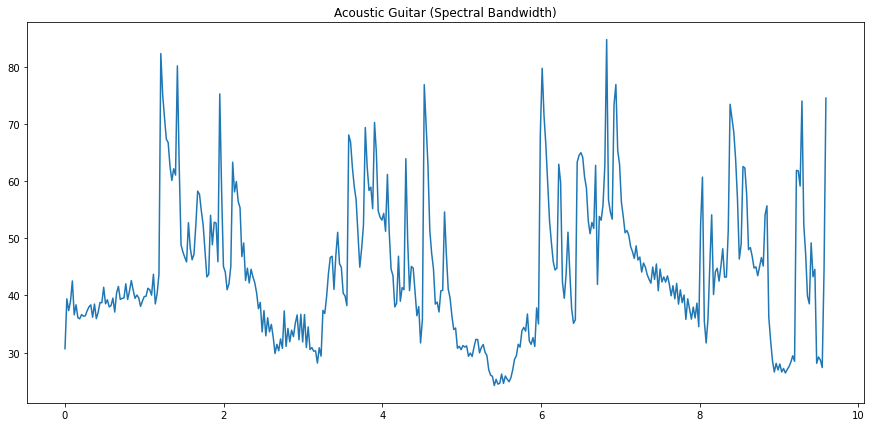

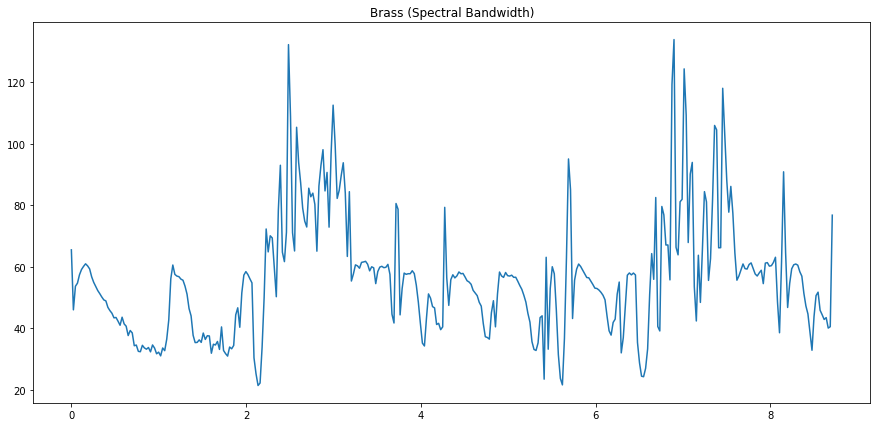

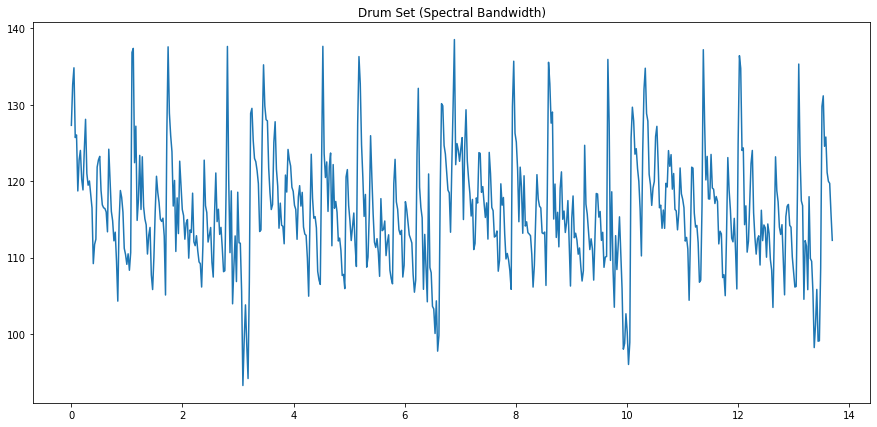

In [137]:
def spectral_bandwidth(signal, sample_rate, frame_size=1024, hop_length=512):
    """
    Compute the Spectral Bandwidth of a signal.

    Args:
        signal (array): The input signal.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        ndarray: The spectral bandwidths for each frame of the signal.
    """
    # Compute the spectrogram of the signal
    spec = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)
    # Extract the magnitude and transpose it
    modified_spec = np.abs(spec).T
    res = []
    for sub_arr in modified_spec:
        # Compute the spectral bandwidth
        sb_val = sb(sub_arr)
        # Store the value of spectral bandwidth for current frame
        res.append(sb_val)
    return np.array(res)

def sb(arr):
    """
    Computes the spectral bandwidth in a signal.

    Args:
        arr (array): Frequency domain array for current frame.

    Returns:
        float: The spectral bandwidth value for current frame.
    """
    res = 0
    sc_val = sc(arr)
    for i in range(0, len(arr)):
        # Compute weighted sum
        res += (abs(i - sc_val))*arr[i]
    return res/sum(arr)

def plot_spectral_bandwidth(signal, sample_rate, name, frame_size=1024, hop_length=512):
    """
    Plot the spectral bandwidth of a signal over time.

    Args:
        signal (ndarray): The input signal.
        sample_rate (int): The sample rate of the audio.
        name (str): The name of the signal for the plot title.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.
    """
    # Compute the Spectral bandwidth
    sb_arr = spectral_bandwidth(signal, sample_rate, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(sb_arr))
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Plot the Spectral Bandwidth over time
    plt.plot(time, sb_arr)
    # Set the title of the plot
    plt.title(name + " (Spectral Bandwidth)")
    # Show the plot
    plt.show()
    
plot_spectral_bandwidth(acoustic_guitar, sr, "Acoustic Guitar")
plot_spectral_bandwidth(brass, sr, "Brass")
plot_spectral_bandwidth(drum_set, sr, "Drum Set")

### Spectral Flatness

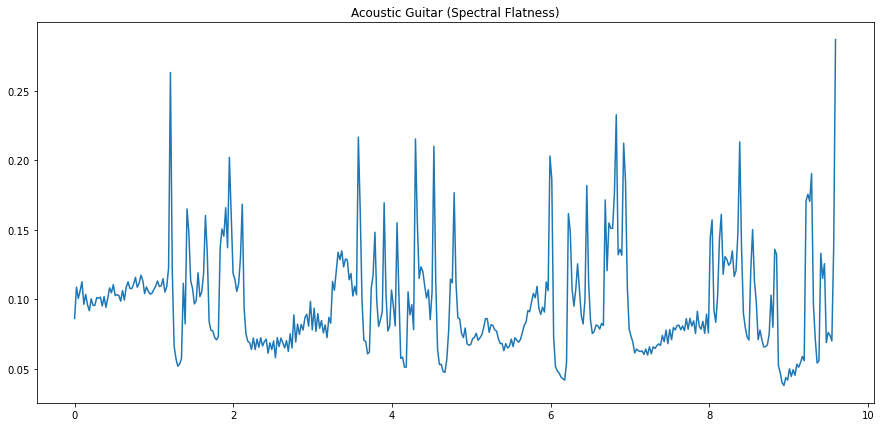

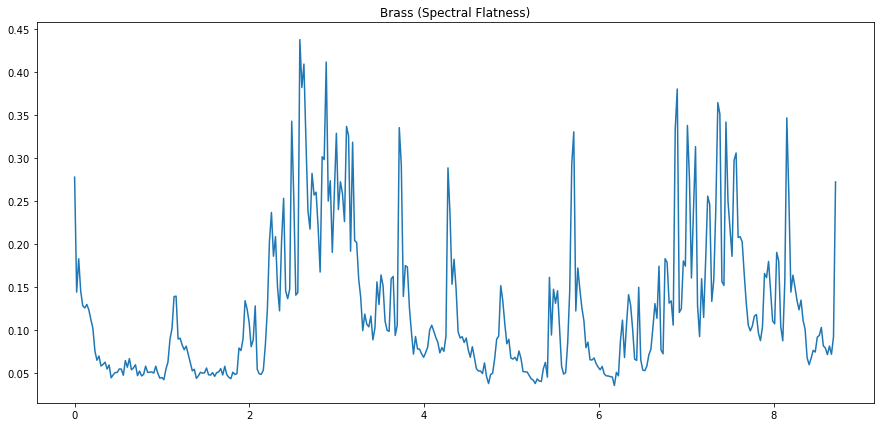

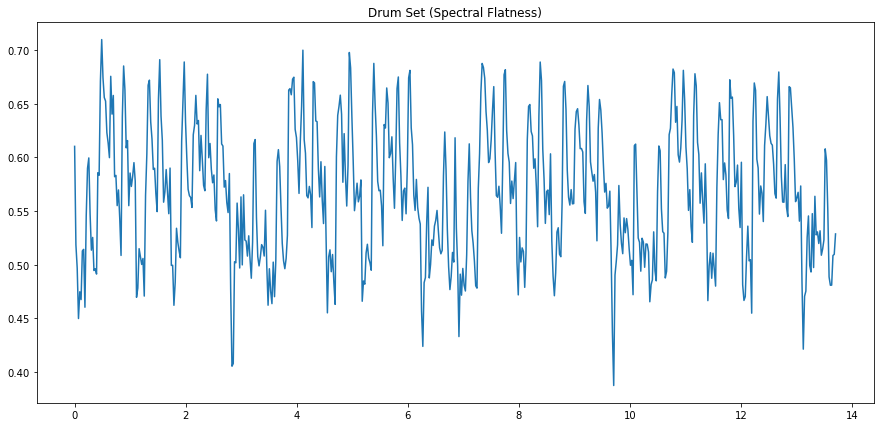

In [141]:
def spectral_flatness(signal, sample_rate, frame_size=1024, hop_length=512):
    """
    Compute the Spectral Flatness of a signal.

    Args:
        signal (array): The input signal.
        sample_rate (int): The sample rate of the audio.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.

    Returns:
        ndarray: The spectral flatness for each frame of the signal.
    """
    # Compute the spectrogram of the signal
    spec = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)
    # Extract the magnitude and transpose it
    modified_spec = np.abs(spec).T
    res = []
    for sub_arr in modified_spec:
        # Compute the geometric mean
        geom_mean = np.exp(np.log(sub_arr).mean())
        # Compute the arithmetic mean
        ar_mean = np.mean(sub_arr)
        # Compute the spectral flatness
        sl_val = geom_mean/ar_mean
        # Store the value of spectral flatness for current frame
        res.append(sl_val)
    return np.array(res)

def plot_spectral_flatness(signal, sample_rate, name, frame_size=1024, hop_length=512):
    """
    Plot the spectral flatness of a signal over time.

    Args:
        signal (ndarray): The input signal.
        sample_rate (int): The sample rate of the audio.
        name (str): The name of the signal for the plot title.
        frame_size (int, optional): The size of each frame in samples. Default is 1024.
        hop_length (int, optional): The number of samples between consecutive frames. Default is 512.
    """
    # Compute the Spectral bandwidth
    sl_arr = spectral_flatness(signal, sample_rate, frame_size, hop_length)
    # Generate the frame indices
    frames = range(0, len(sl_arr))
    # Convert frames to time
    time = librosa.frames_to_time(frames, hop_length=hop_length)
    # Create a new figure with a specific size
    plt.figure(figsize=(15, 7))
    # Plot the Spectral Flatness over time
    plt.plot(time, sl_arr)
    # Set the title of the plot
    plt.title(name + " (Spectral Flatness)")
    # Show the plot
    plt.show()
    
plot_spectral_flatness(acoustic_guitar, sr, "Acoustic Guitar")
plot_spectral_flatness(brass, sr, "Brass")
plot_spectral_flatness(drum_set, sr, "Drum Set")